In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI4 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI4")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI4.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI4 (Lubang Buaya),0.341317,0.357143,0.192308,0.255208,0.037736,0.350254,PM10,Sedang
1,2017-01-02,DKI4 (Lubang Buaya),0.137725,0.342857,0.038462,0.161458,0.028302,0.182741,O3,Baik
2,2017-01-03,DKI4 (Lubang Buaya),0.257485,0.342857,0.038462,0.195833,0.037736,0.279188,PM10,Sedang
3,2017-01-04,DKI4 (Lubang Buaya),0.233533,0.342857,0.096154,0.427083,0.056604,0.441624,O3,Sedang
4,2017-01-05,DKI4 (Lubang Buaya),0.215569,0.357143,0.125000,0.322917,0.075472,0.340102,O3,Sedang


Train Test Data

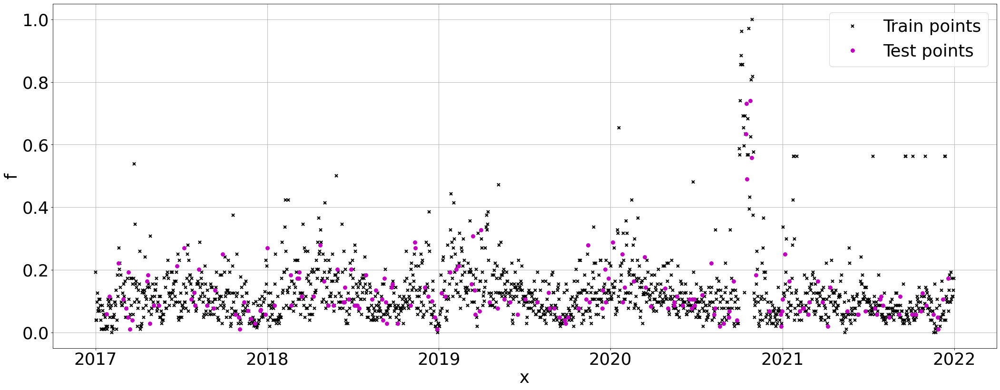

In [4]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['CO']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [177]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [178]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [5]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [180]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.0609612635976743
MSE: 0.009173251163418281
RMSE: 0.09577709101564048
MAPE: 765731717272.7909
R2 Square 0.21753472725647105
__________________________________


In [181]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.3723080424211165

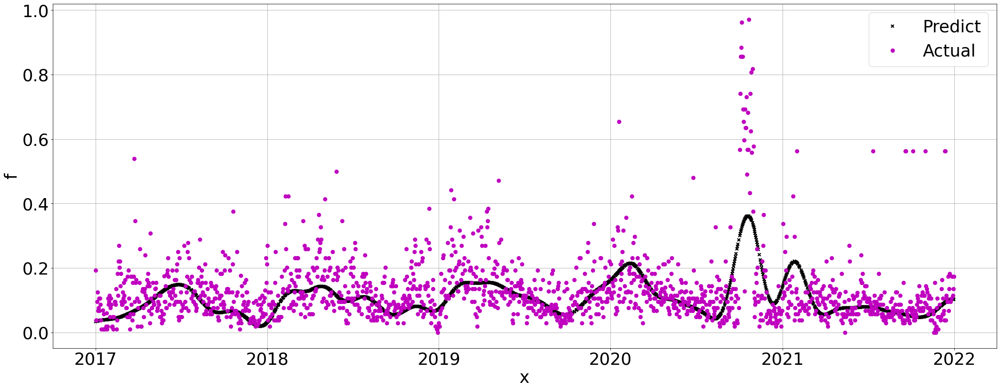

In [182]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

Periodic

In [183]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [184]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [185]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06464592329781708
MSE: 0.01178426294099742
RMSE: 0.10855534505954749
MAPE: 1351185214117.6711
R2 Square -0.005180862482022874
__________________________________


In [186]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.005355278080745984

White

In [187]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [188]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [189]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.12887595376206304
MSE: 0.028332536428403037
RMSE: 0.16832271512901353
MAPE: 0.9975669099756691
R2 Square -1.4167250464452894
__________________________________


In [190]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-1.1866921935273642

Linear

In [191]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [192]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [193]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08776068122451379
MSE: 0.015639604311445777
RMSE: 0.12505840360186027
MAPE: 1826836817931.3396
R2 Square -0.3340359960880197
__________________________________


In [194]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

-0.14183699817274453

Exponential

In [195]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [196]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [197]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06197437637176053
MSE: 0.010194770726157334
RMSE: 0.10096915730141227
MAPE: 1009030374791.8307
R2 Square 0.13040056194995675
__________________________________


In [198]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.2392962086459387

Matern32

In [199]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [200]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [201]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06299359458431074
MSE: 0.01067378441551741
RMSE: 0.10331400880576366
MAPE: 992413153583.4722
R2 Square 0.08954137577747778
__________________________________


In [202]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.180927553449297

Matern52

In [203]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [204]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [205]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06284681007960741
MSE: 0.010679084936027254
RMSE: 0.10333965809904373
MAPE: 984011505356.8997
R2 Square 0.08908924891944991
__________________________________


In [206]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.18900040468891244

Brownian

In [6]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [208]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04665232838657021
MSE: 0.0035580673420231063
RMSE: 0.05964953765137754
MAPE: 0.6564628929378794
R2 Square 0.6963477375959028
__________________________________


In [210]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.24402979265215108

Bias

In [211]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [212]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [213]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06448064427955516
MSE: 0.011770934519408733
RMSE: 0.10849393770809838
MAPE: 1336730767947.3943
R2 Square -0.004043967083887212
__________________________________


In [214]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-2.5722003794470538e-05

Periodik Eksponensial

In [215]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [216]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [217]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06885500003865408
MSE: 0.012492855403258174
RMSE: 0.11177144270008406
MAPE: 1300033578834.963
R2 Square -0.06562279134339954
__________________________________


In [218]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

0.07190994935226236